### 1. **Introduction to Computer Vision**
   - **1.1 What is Computer Vision?**
     - Overview of Computer Vision as the ability of computers to see and understand images and videos.


### 2. **Setting Up the Environment**
   - **2.1 Importing Libraries**
     - Import necessary Python libraries for image processing and computer vision tasks.

In [1]:
from skimage.exposure import rescale_intensity
import argparse
import cv2
import numpy as np
import matplotlib.pyplot as plt

   - **2.2 Loading an Image**

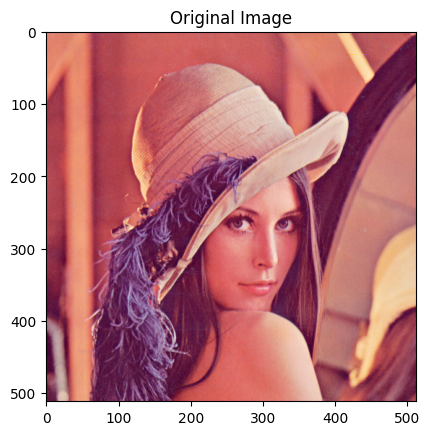

In [2]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/DataSets/Lenna.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.title('Original Image')
plt.show()


### 3. **Image Representation and Basic Operations**
   - **3.1 Image Formats and Representation**
     - Convert the image to grayscale and display it.

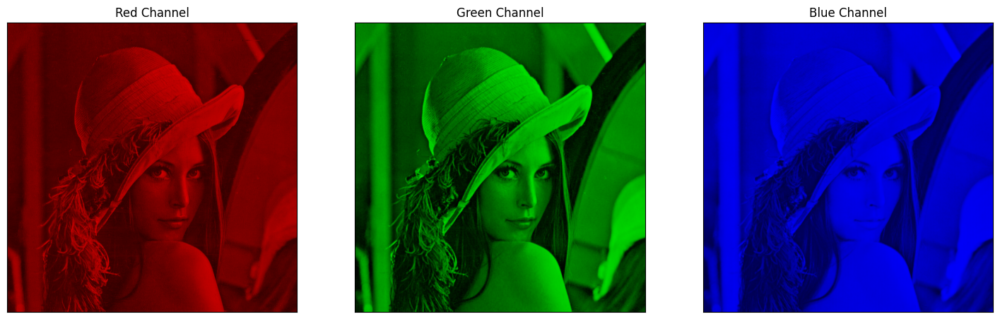

In [3]:

blank = np.zeros(image.shape[:2], dtype='uint8')

# Split the image into its color channels
B, G, R = cv2.split(image)

# Display each channel individually

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1), plt.imshow(cv2.merge([R, blank, blank]))
plt.title('Red Channel'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 2), plt.imshow(cv2.merge([blank, G, blank]))
plt.title('Green Channel'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 3, 3), plt.imshow(cv2.merge([blank, blank, B]))
plt.title('Blue Channel'), plt.xticks([]), plt.yticks([])
plt.show()

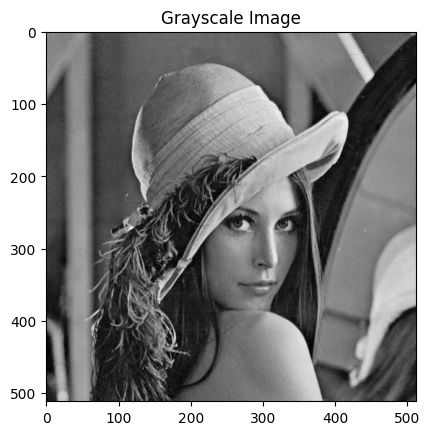

In [4]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.show()

   - **3.2 Basic Image Operations**
     - Demonstrate basic operations like resizing, rotating, and flipping an image.

In [5]:
resized_image = cv2.resize(image, (50, 50))
rotated_image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
flipped_image = cv2.flip(image, 1)

**Resized Image**

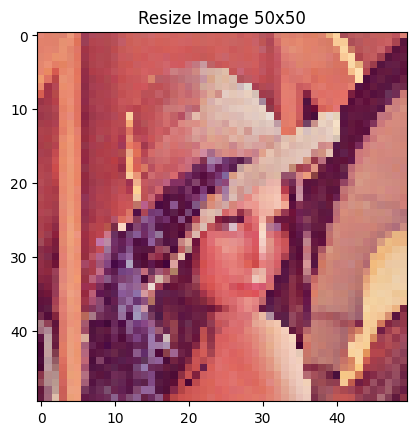

In [6]:
plt.imshow(resized_image)
plt.title('Resize Image 50x50')
plt.show()

**Rotated Image**

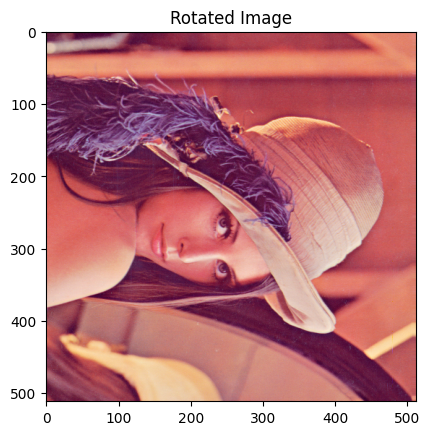

In [7]:
plt.imshow(rotated_image)
plt.title('Rotated Image')
plt.show()

**Flipped Image**

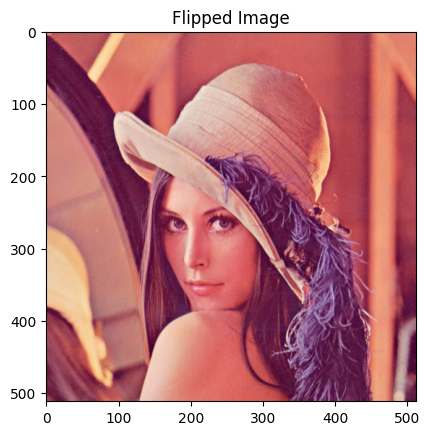

In [8]:
plt.imshow(flipped_image)
plt.title('Flipped Image')
plt.show()

### 5. **Convolution Operation**
Convolutional Operation means for a given input we re-estimate it as the weighted average of all the inputs around it. We have some weights assigned to the neighbor values and we take the weighted sum of the neighbor values to estimate the value of the current input/pixel.

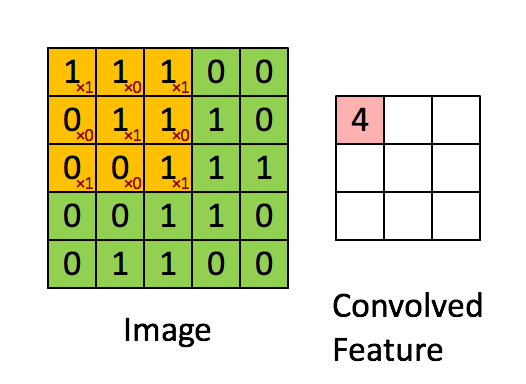

In [9]:
def convolve(image, kernel):
    # grab the spatial dimensions of the image, along with
    # the spatial dimensions of the kernel
    (iH, iW) = image.shape[:2]
    (kH, kW) = kernel.shape[:2]

    # allocate memory for the output image, taking care to
    # "pad" the borders of the input image so the spatial
    # size (i.e., width and height) are not reduced
    pad = (kW - 1) // 2
    image = cv2.copyMakeBorder(image, pad, pad, pad, pad,
        cv2.BORDER_REPLICATE)
    output = np.zeros((iH, iW), dtype="float32")

    # loop over the input image, "sliding" the kernel across
    # each (x, y)-coordinate from left-to-right and top to
    # bottom
    for y in np.arange(pad, iH + pad):
        for x in np.arange(pad, iW + pad):
            # extract the ROI of the image by extracting the
            # *center* region of the current (x, y)-coordinates
            # dimensions
            roi = image[y - pad:y + pad + 1, x - pad:x + pad + 1]

            # perform the actual convolution by taking the
            # element-wise multiplicate between the ROI and
            # the kernel, then summing the matrix
            k = (roi * kernel).sum()

            # store the convolved value in the output (x,y)-
            # coordinate of the output image
            output[y - pad, x - pad] = k

    # rescale the output image to be in the range [0, 255]
    output = rescale_intensity(output, in_range=(0, 255))
    output = (output * 255).astype("uint8")

    # return the output image
    return output

### 4. **Edge Detection**
   - **4.1 The Concept of Edges**
     - Explain what edges are and why they are important.
     - Discuss different methods of edge detection.

   - **4.2 Sobel Operator**
     - Explain the Sobel operator.
     - Implement Sobel edge detection.
     - Display results.


### Convolutional Kernels for Image Processing

In image processing, convolutional kernels are used to perform operations like blurring, sharpening, and edge detection. Below are examples of commonly used kernels.

#### 1. Blurring Kernels

Blurring reduces the sharpness of an image by averaging pixel values in a defined neighborhood. Two common types of blurring are:

- **Small Blur Kernel**: A 7x7 kernel for mild blurring.

In [10]:
smallBlur = np.ones((7, 7), dtype="float") * (1.0 / (7 * 7))

- **Large Blur Kernel**: A 21x21 kernel for stronger blurring.

In [11]:
largeBlur = np.ones((21, 21), dtype="float") * (1.0 / (21 * 21))

#### 2. Sharpening Kernel

The sharpening kernel is used to enhance the edges in an image by accentuating the intensity differences between neighboring pixels.


In [12]:
sharpen = np.array((
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]), dtype="int")

#### 3. Edge Detection Kernels

Edge detection is essential for identifying boundaries within an image. Below are some commonly used kernels for edge detection:

- **Laplacian Kernel**: Detects edge-like regions by highlighting areas of rapid intensity change.


In [13]:
laplacian = np.array((
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]), dtype="int")

- **Sobel Kernels**: Used to detect edges along specific directions. Sobel kernels can be applied along the x-axis and y-axis to detect vertical and horizontal edges, respectively.

  - **Sobel X-axis Kernel**: Detects vertical edges.
  - **Sobel Y-axis Kernel**: Detects horizontal edges.

In [14]:
# construct the Sobel x-axis kernel
sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype="int")

# construct the Sobel y-axis kernel
sobelY = np.array((
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]), dtype="int")

> These kernels can be applied to an image using convolution operations, which help in extracting useful features for various computer vision tasks.

In [15]:
kernelBank = (
    ("small_blur", smallBlur),
    ("large_blur", largeBlur),
    ("sharpen", sharpen),
    ("laplacian", laplacian),
    ("sobel_x", sobelX),
    ("sobel_y", sobelY)
)

[INFO] applying small_blur kernel


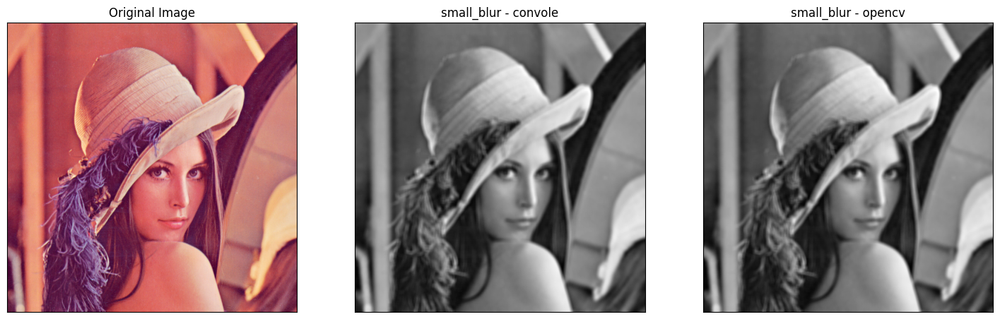

[INFO] applying large_blur kernel


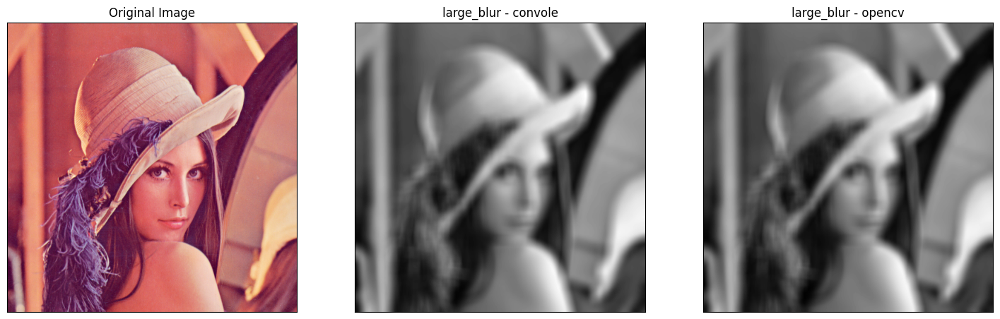

[INFO] applying sharpen kernel


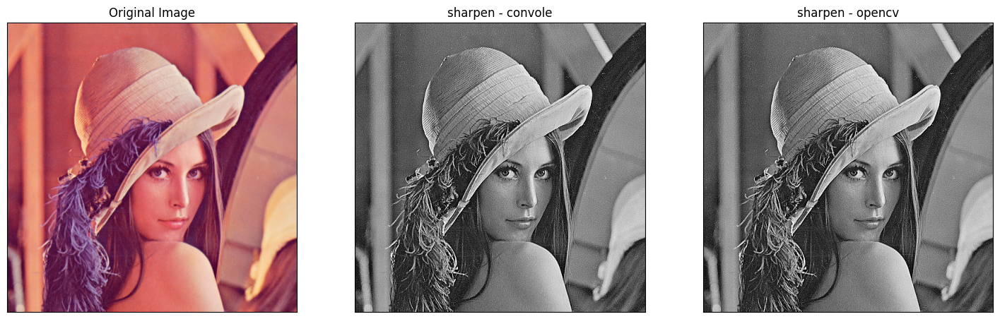

[INFO] applying laplacian kernel


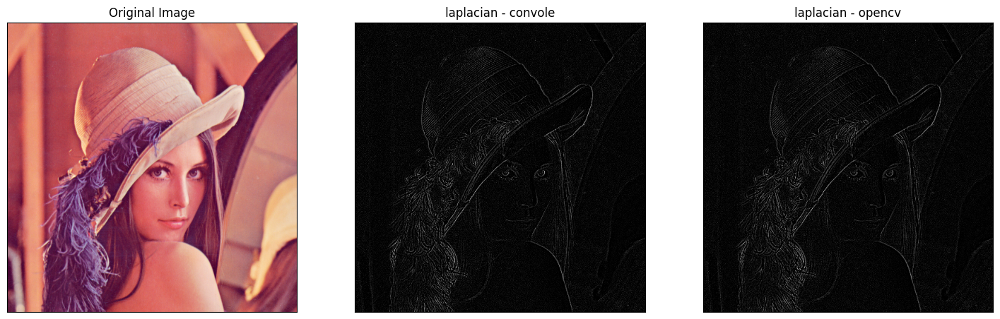

[INFO] applying sobel_x kernel


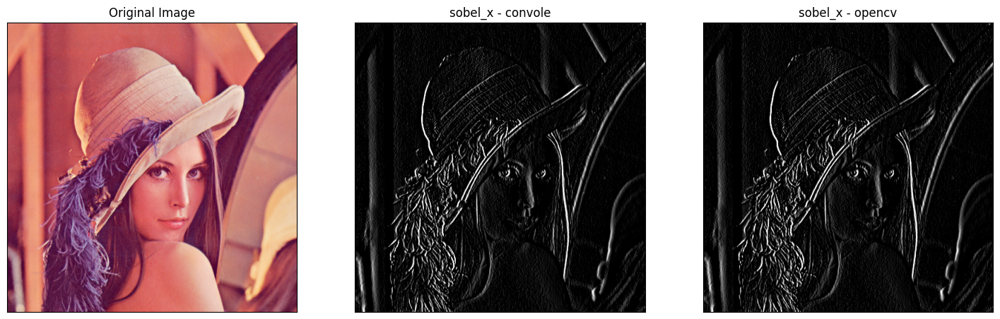

[INFO] applying sobel_y kernel


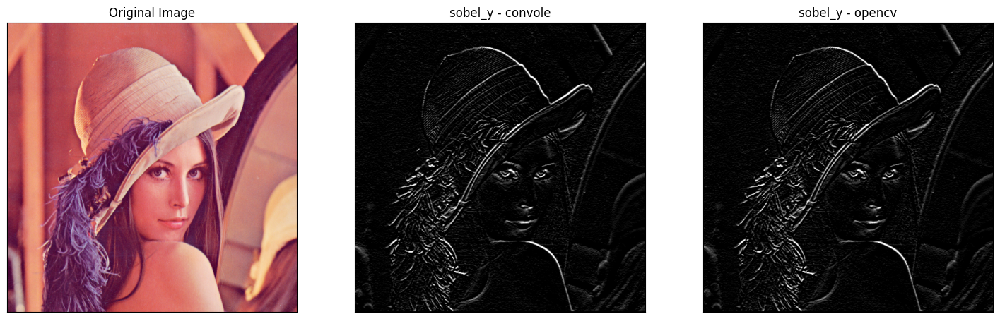

In [16]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# loop over the kernels
for (kernelName, kernel) in kernelBank:
    # apply the kernel to the grayscale image using both
    # our custom `convole` function and OpenCV's `filter2D`
    # function
    print("[INFO] applying {} kernel".format(kernelName))
    convoleOutput = convolve(gray, kernel)
    opencvOutput = cv2.filter2D(gray, -1, kernel)

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1), plt.imshow(image)
    plt.title("Original Image"), plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 2), plt.imshow(convoleOutput, cmap='gray')
    plt.title("{} - convole".format(kernelName)), plt.xticks([]), plt.yticks([])
    plt.subplot(1, 3, 3), plt.imshow(opencvOutput, cmap='gray')
    plt.title("{} - opencv".format(kernelName)), plt.xticks([]), plt.yticks([])
    plt.show()



> For edge detection and segmentation tasks, it is adviced to read the image as grayscale. Color images do not perform well in treditional Computer Vision tasks.



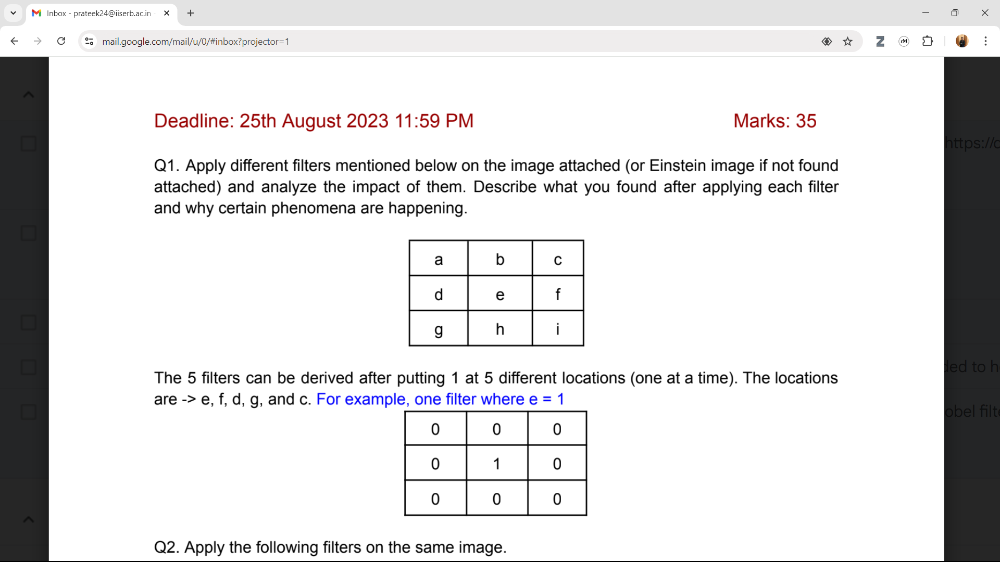

In [17]:
# Define the filters
filter_c = np.array((
    [0, 0, 3],
    [0, 0, 0],
    [0, 0, 0]), dtype="int")

filter_d = np.array((
    [0, 0, 0],
    [3, 0, 0],
    [0, 0, 0]), dtype="int")

filter_e = np.array((
    [0, 0, 0],
    [0, 3, 0],
    [0, 0, 0]), dtype="int")

filter_f = np.array((
    [0, 0, 0],
    [0, 0, 3],
    [0, 0, 0]), dtype="int")

filter_g = np.array((
    [0, 0, 0],
    [0, 0, 0],
    [3, 0, 0]), dtype="int")

In [18]:
# List of filters and their names
filters = [(filter_c, "Filter C"),
           (filter_d, "Filter D"),
           (filter_e, "Filter E"),
           (filter_f, "Filter F"),
           (filter_g, "Filter H")]

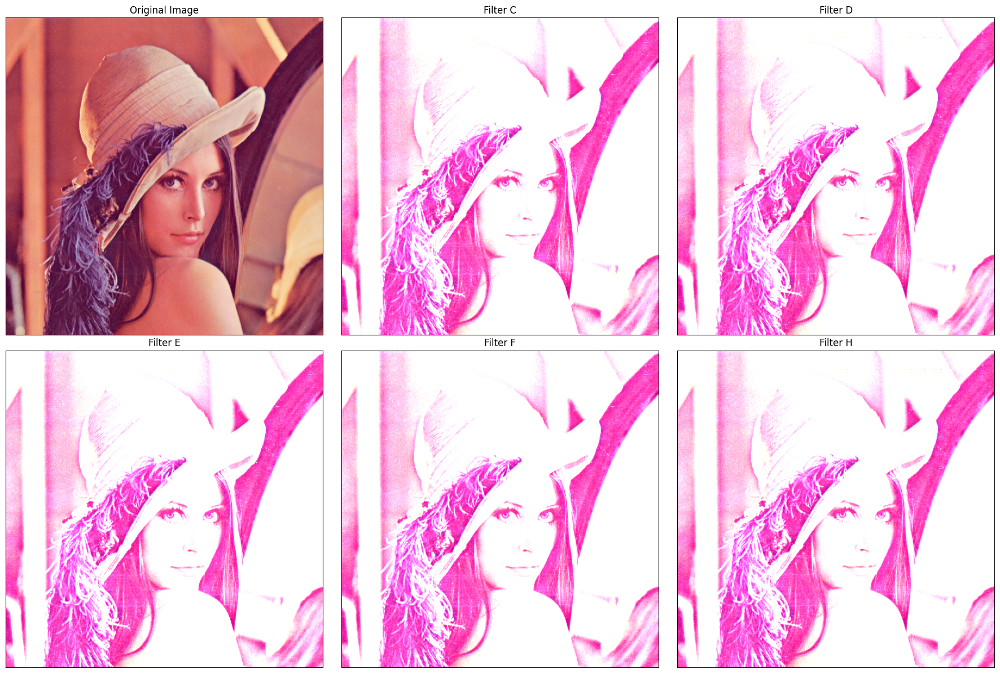

In [19]:
# Initialize the figure with a 2x3 grid for displaying the images
plt.figure(figsize=(18, 12))
# image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# Display the original image in the first position (top-left corner)
plt.subplot(2, 3, 1)
plt.imshow(image)
plt.title("Original Image")
plt.xticks([]), plt.yticks([])

# Apply each filter to the image and display the result
for i, (kernel, kernelName) in enumerate(filters):
    # Apply convolution using cv2.filter2D
    convoleOutput = cv2.filter2D(image, -1, kernel)

    # Plot the convolution output
    plt.subplot(2, 3, i + 2)  # Start from the second subplot
    plt.imshow(convoleOutput)
    plt.title(kernelName)
    plt.xticks([]), plt.yticks([])

# Adjust layout and display all images
plt.tight_layout()
plt.show()

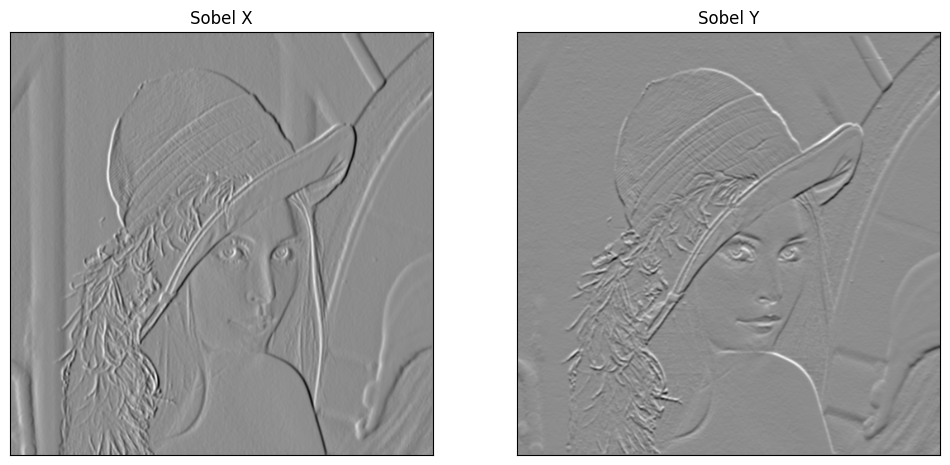

In [20]:
# image = cv2.imread('/content/Lenna.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1), plt.imshow(sobelx, cmap='gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 2, 2), plt.imshow(sobely, cmap='gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.show()


   - **4.3 Canny Edge Detection**

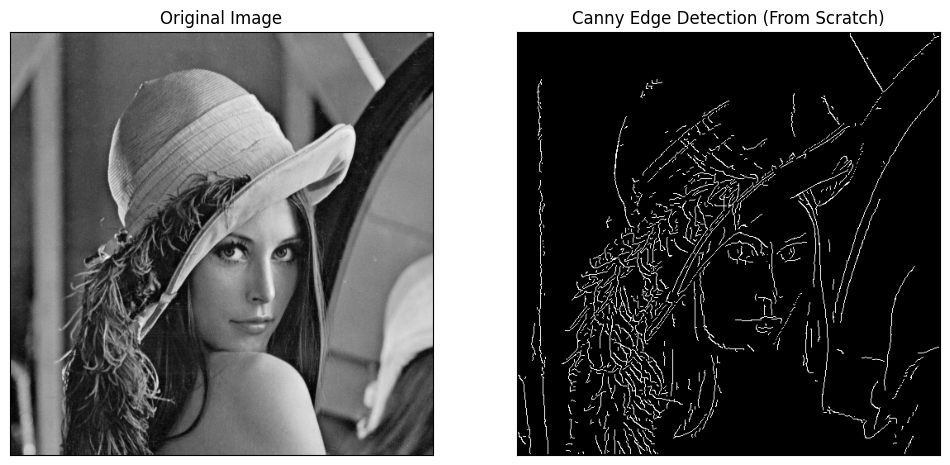

In [21]:
def gaussian_blur(image, kernel_size=5, sigma=1):
    kernel = cv2.getGaussianKernel(kernel_size, sigma)
    gaussian_kernel = np.outer(kernel, kernel)
    return cv2.filter2D(image, -1, gaussian_kernel)

def sobel_filters(image):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = cv2.filter2D(image, -1, Kx)
    Iy = cv2.filter2D(image, -1, Ky)

    G = np.hypot(Ix, Iy)  # Gradient magnitude
    theta = np.arctan2(Iy, Ix)  # Gradient direction

    return G, theta

def non_maximum_suppression(G, theta):
    M, N = G.shape
    Z = np.zeros((M, N), dtype=np.int32)
    angle = theta * 180.0 / np.pi
    angle[angle < 0] += 180

    for i in range(1, M-1):
        for j in range(1, N-1):
            try:
                q = 255
                r = 255

                # Angle 0
                if (0 <= angle[i, j] < 22.5) or (157.5 <= angle[i, j] <= 180):
                    q = G[i, j + 1]
                    r = G[i, j - 1]
                # Angle 45
                elif 22.5 <= angle[i, j] < 67.5:
                    q = G[i + 1, j - 1]
                    r = G[i - 1, j + 1]
                # Angle 90
                elif 67.5 <= angle[i, j] < 112.5:
                    q = G[i + 1, j]
                    r = G[i - 1, j]
                # Angle 135
                elif 112.5 <= angle[i, j] < 157.5:
                    q = G[i - 1, j - 1]
                    r = G[i + 1, j + 1]

                if (G[i, j] >= q) and (G[i, j] >= r):
                    Z[i, j] = G[i, j]
                else:
                    Z[i, j] = 0

            except IndexError as e:
                pass

    return Z

def double_thresholding(img, low_threshold, high_threshold):
    strong = 255
    weak = 25

    strong_i, strong_j = np.where(img >= high_threshold)
    weak_i, weak_j = np.where((img <= high_threshold) & (img >= low_threshold))

    result = np.zeros(img.shape, dtype=np.uint8)
    result[strong_i, strong_j] = strong
    result[weak_i, weak_j] = weak

    return result, weak, strong

def edge_tracking_by_hysteresis(img, weak, strong=255):
    M, N = img.shape
    for i in range(1, M-1):
        for j in range(1, N-1):
            if img[i, j] == weak:
                if ((img[i + 1, j - 1] == strong) or (img[i + 1, j] == strong) or (img[i + 1, j + 1] == strong)
                        or (img[i, j - 1] == strong) or (img[i, j + 1] == strong)
                        or (img[i - 1, j - 1] == strong) or (img[i - 1, j] == strong) or (img[i - 1, j + 1] == strong)):
                    img[i, j] = strong
                else:
                    img[i, j] = 0
    return img

def canny_edge_detection(image, low_threshold, high_threshold):
    blurred_image = gaussian_blur(image)
    G, theta = sobel_filters(blurred_image)
    suppressed_image = non_maximum_suppression(G, theta)
    thresholded_image, weak, strong = double_thresholding(suppressed_image, low_threshold, high_threshold)
    final_image = edge_tracking_by_hysteresis(thresholded_image, weak, strong)
    return final_image

# Perform Canny edge detection
edges = canny_edge_detection(image, low_threshold=25, high_threshold=50)

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.xticks([]), plt.yticks([])

plt.subplot(1, 2, 2)
plt.imshow(edges, cmap='gray')
plt.title("Canny Edge Detection (From Scratch)")
plt.xticks([]), plt.yticks([])

plt.show()


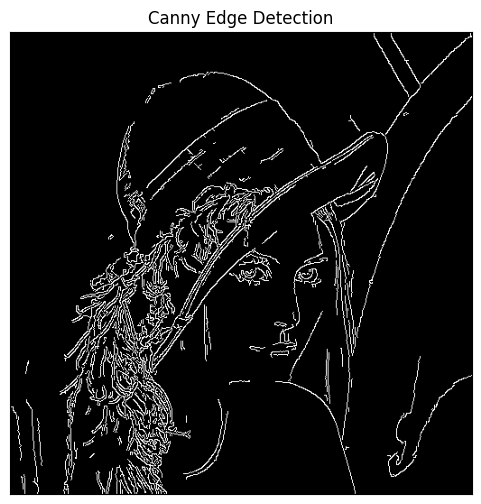

In [22]:
edges = cv2.Canny(image, 100, 200)

plt.figure(figsize=(6, 6))
plt.imshow(edges, cmap='gray')
plt.title('Canny Edge Detection')
plt.xticks([]), plt.yticks([])
plt.show()

### 5. **Hough Transform**
   - **5.1 Introduction to Hough Transform**
     - Explain what Hough Transform is.
     - Discuss how it can be used for line and circle detection.

   - **5.2 Line Detection using Hough Transform**
     - Implement Hough Line Transform.
     - Display the detected lines on the image.

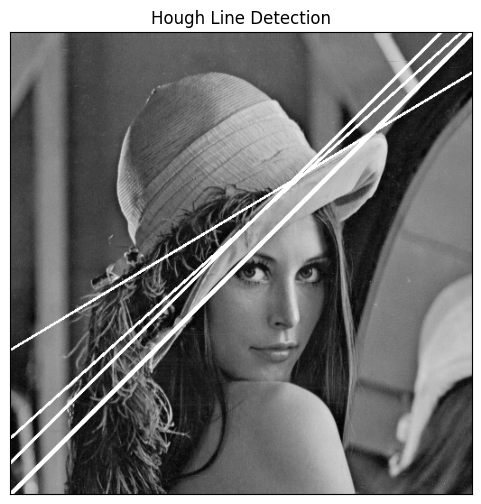

In [23]:
lines = cv2.HoughLines(edges, 1, np.pi/180, 150)
line_image = image.copy()

for rho, theta in lines[:, 0]:
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    x2 = int(x0 - 1000 * (-b))
    y1 = int(y0 + 1000 * a)
    y2 = int(y0 - 1000 * a)
    cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 2)

plt.figure(figsize=(6, 6))
plt.imshow(line_image, cmap='gray')
plt.title('Hough Line Detection')
plt.xticks([]), plt.yticks([])
plt.show()

   - **5.3 Circle Detection using Hough Transform**
     - Implement Hough Circle Transform.
     - Display the detected circles on the image.

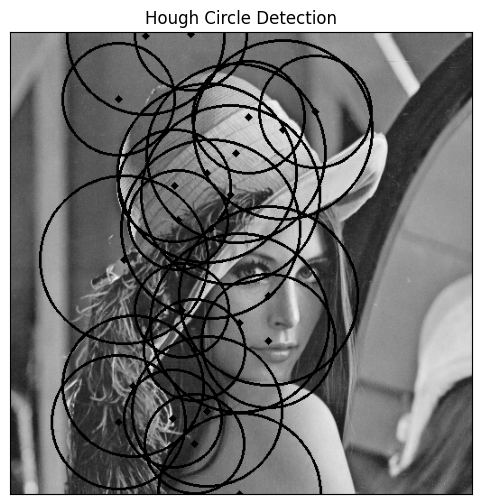

In [24]:
circles = cv2.HoughCircles(image, cv2.HOUGH_GRADIENT, 1, 35, param1=20, param2=60, minRadius=50, maxRadius=100)
circles = np.uint16(np.around(circles))
circle_image = image.copy()

for i in circles[0, :]:
    cv2.circle(circle_image, (i[0], i[1]), i[2], (0, 255, 0), 2)
    cv2.circle(circle_image, (i[0], i[1]), 2, (0, 0, 255), 3)

plt.figure(figsize=(6, 6))
plt.imshow(circle_image, cmap='gray')
plt.title('Hough Circle Detection')
plt.xticks([]), plt.yticks([])
plt.show()

### 6. **Image Segmentation**
   - **6.1 Introduction to Image Segmentation**
     - Explain what image segmentation is and its applications.
     - Discuss different techniques like thresholding, region-based, and clustering methods.

   - **6.2 Thresholding**
     - Implement global and adaptive thresholding.
     - Display results.

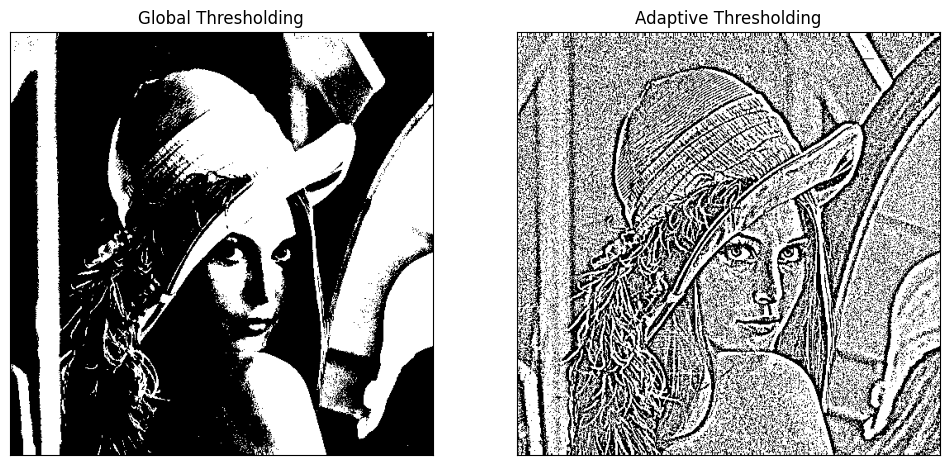

In [25]:
ret,thresh1 = cv2.threshold(image,127,255,cv2.THRESH_BINARY)
thresh2 = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1), plt.imshow(thresh1, cmap='gray')
plt.title('Global Thresholding'), plt.xticks([]), plt.yticks([])
plt.subplot(1, 2, 2), plt.imshow(thresh2, cmap='gray')
plt.title('Adaptive Thresholding'), plt.xticks([]), plt.yticks([])
plt.show()

   - **6.3 K-Means Clustering**
     - Implement K-Means segmentation.
     - Display results.

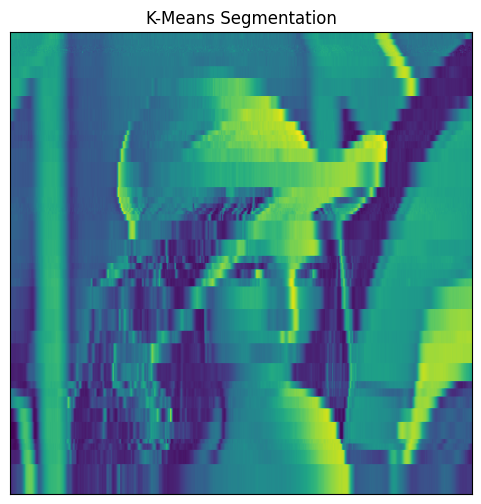

In [26]:
# Z = image.reshape((-1,3))
Z = image.copy()
Z = np.float32(Z)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 5, 0.5)
K = 50
ret,label,center = cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
segmented_image = res.reshape((image.shape))

plt.figure(figsize=(6, 6))
plt.imshow(segmented_image)
plt.title('K-Means Segmentation')
plt.xticks([]), plt.yticks([])
plt.show()

### 7. **Homework / Assignment**
- **7.1 Implement Hough Transform**
- **7.2 Implement K-Means clustering**

You are to use only Numpy library.  
**Can not use in-built functions of OpenCV, SK-Learn, etc.**